# Image Recognition And Classification Using Deep Learning

Name = Manjeet Kumar

College = Government Engineering College , Ajmer



# Download Dataset

In [1]:
!wget https://download.microsoft.com/download/3/e/1/3e1c3f21-ecdb-4869-8368-6deba77b919f/kagglecatsanddogs_5340.zip

--2025-07-13 09:41:12--  https://download.microsoft.com/download/3/e/1/3e1c3f21-ecdb-4869-8368-6deba77b919f/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 2.22.76.162, 2a02:26f0:6d00:3b6::317f, 2a02:26f0:6d00:39f::317f
Connecting to download.microsoft.com (download.microsoft.com)|2.22.76.162|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M   111MB/s    in 9.1s    

2025-07-13 09:41:21 (86.5 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



# Unzip the Dataset

In [2]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

# Import Modules

In [339]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from tensorflow.keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

# Create Dataframe for Input and Output

In [57]:
import os
import random

cat_paths = os.listdir("PetImages/Cat")
dog_paths = os.listdir("PetImages/Dog")

# Remove any hidden files or system files
cat_paths = [f for f in cat_paths if f.endswith(".jpg")]
dog_paths = [f for f in dog_paths if f.endswith(".jpg")]

# Shuffle and limit to 5000 each
random.shuffle(cat_paths)
random.shuffle(dog_paths)

cat_paths = cat_paths[:5000]
dog_paths = dog_paths[:5000]

input_path = []
label = []

# Add cat images
for path in cat_paths:
    input_path.append(os.path.join("PetImages/Cat", path))
    label.append(0)

# Add dog images
for path in dog_paths:
    input_path.append(os.path.join("PetImages/Dog", path))
    label.append(1)

# Shuffle all together
combined = list(zip(input_path, label))
random.shuffle(combined)
input_path, label = zip(*combined)

print(f"Total images: {len(input_path)}")
print(f"Sample: {input_path[0]}, Label: {label[0]}")



Total images: 10000
Sample: PetImages/Cat/4772.jpg, Label: 0


In [58]:
df = pd.DataFrame()
df['image'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,image,label
0,PetImages/Cat/11018.jpg,0
1,PetImages/Cat/9586.jpg,0
2,PetImages/Dog/62.jpg,1
3,PetImages/Cat/5321.jpg,0
4,PetImages/Cat/1154.jpg,0


In [59]:
for i in df['image']:
  if '.jpg' not in i :
    print(i)

In [60]:
from PIL import Image
bad_images = []

for image_path in df['image']:
    try:
        img = Image.open(image_path)
        img.verify()

    except:
        bad_images.append(image_path)

bad_images

[]

In [61]:
# delete db files
df = df[df['image']!='PetImages/Cat/Thumbs.db']
df = df[df['image']!='PetImages/Dog/Thumbs.db']
df = df[df['image']!='PetImages/Cat/666.jpg']
df = df[df['image']!='PetImages/Dog/11702.jpg']


len(df)

10000

# Exploratory Data Analysis

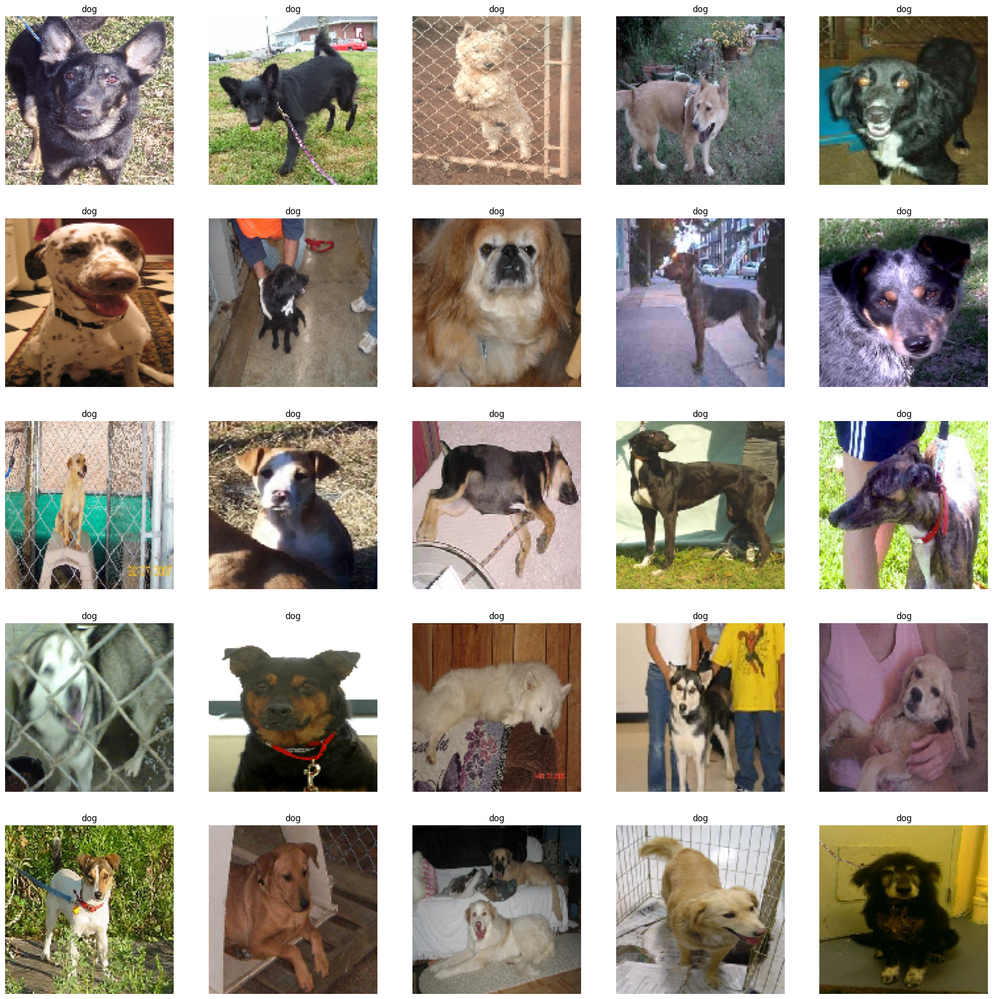

In [62]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['image']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5,index+1)
  img = load_img(file, target_size=(128, 128))
  img = np.array(img)
  plt.imshow(img)
  plt.title('dog')
  plt.axis('off')

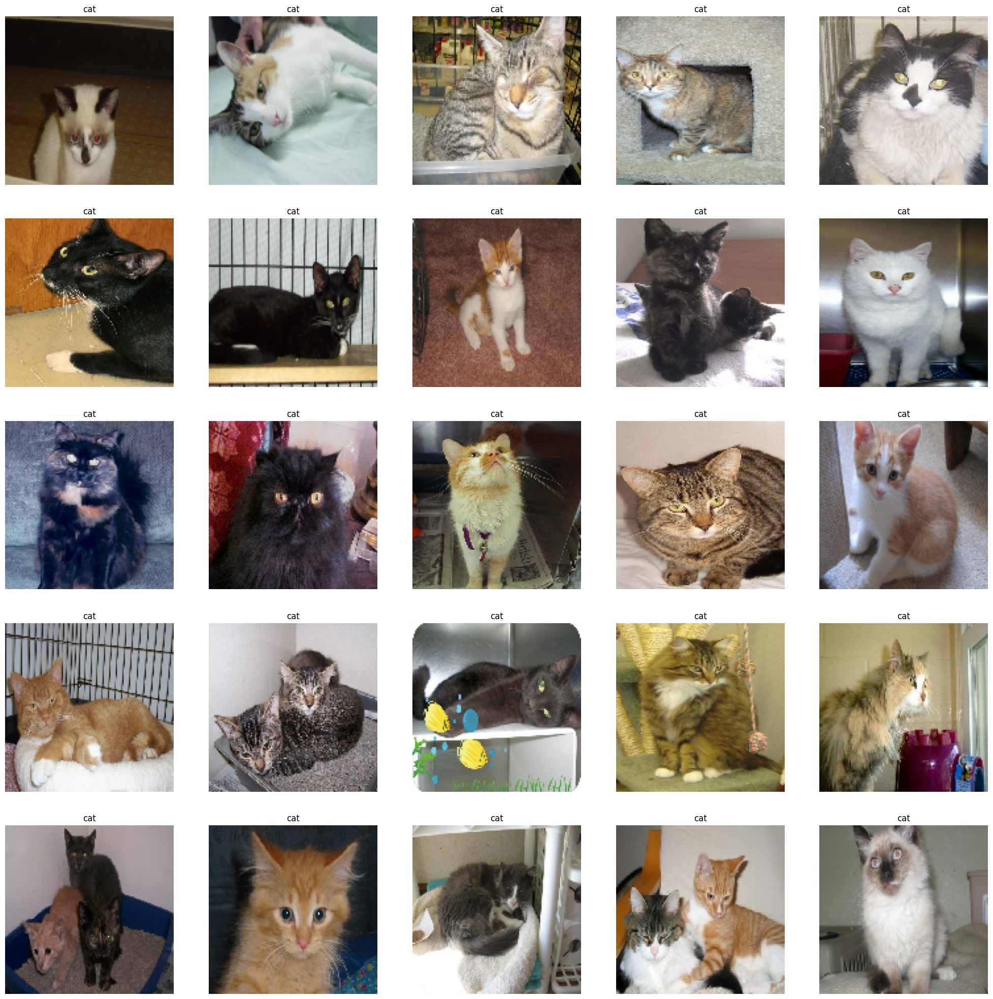

In [63]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['image']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5,index+1)
  img = load_img(file, target_size=(128,128))
  img = np.array(img)
  plt.imshow(img)
  plt.title('cat')
  plt.axis('off')

In [64]:
# !pip install matplotlib seaborn

# Create DataGenerator for the Images

In [65]:
print(df['label'].value_counts())

label
0    5000
1    5000
Name: count, dtype: int64


In [66]:
df['label'] = df['label'].astype('str')

In [67]:
print(f"Minority class size: {len(df_minority)}")

Minority class size: 0


In [68]:
if len(df_minority) > 0:
    df_majority_downsampled = resample(
        df_majority,
        replace=False,
        n_samples=len(df_minority),
        random_state=42
    )
    df_balanced = pd.concat([df_majority_downsampled, df_minority])
    df_balanced = df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)
else:
    print("Error: Minority class is empty. Cannot perform resampling.")

Error: Minority class is empty. Cannot perform resampling.


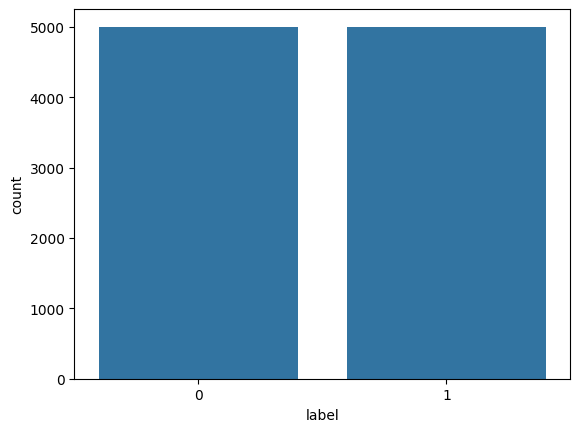

In [71]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x = df['label'])
plt.show()

In [72]:
# input split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [73]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Compute class weights from the training set
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.array([0, 1]),
    y=train['label'].astype(int)
)

# Convert to dictionary for Keras
class_weights = {i : class_weights[i] for i in range(2)}
print("Class weights:", class_weights)


Class weights: {0: np.float64(1.0052777079668258), 1: np.float64(0.9947774185525988)}


In [74]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255 , # normlization of images
    rotation_range = 40, # augmention of images to avoid overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest',
)

val_generator = ImageDataGenerator(
    rescale = 1./255
)


train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col = 'image',
    y_col = 'label',
    target_size = (128, 128),
    batch_size = 512,
    class_mode = 'binary',
)

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col = 'image',
    y_col = 'label',
    target_size = (128 , 128),
    batch_size = 512,
    class_mode = 'binary',
)

Found 8000 validated image filenames belonging to 2 classes.
Found 2000 validated image filenames belonging to 2 classes.


# Model creation

In [75]:
from keras import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

model = Sequential([
          Conv2D(32, (3,3), activation='relu', input_shape=(128 , 128,3)),
          Conv2D(64, (3,3), activation='relu'),
          MaxPooling2D(2,2),
          MaxPooling2D(2,2),
          Conv2D(128, (3,3), activation='relu'),
          MaxPooling2D(2,2),
          Flatten(),
          Dense(512, activation='relu'),
          Dense(1, activation='sigmoid'),

])


In [76]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 124, 124, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 31, 31, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 29, 29, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │    12,845,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,939,329 (49.36 MB)

 Trainable params: 12,939,329 (49.36 MB)

 Non-trainable params: 0 (0.00 B)

In [77]:
history = model.fit(train_iterator, epochs=5, validation_data=val_iterator , class_weight=class_weights)

Epoch 1/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 706s 44s/step - accuracy: 0.5134 - loss: 0.8444 - val_accuracy: 0.5470 - val_loss: 0.6752
Epoch 2/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 738s 47s/step - accuracy: 0.5874 - loss: 0.6639 - val_accuracy: 0.6325 - val_loss: 0.6272
Epoch 3/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 685s 43s/step - accuracy: 0.6211 - loss: 0.6359 - val_accuracy: 0.6515 - val_loss: 0.6138
Epoch 4/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 747s 43s/step - accuracy: 0.6903 - loss: 0.5784 - val_accuracy: 0.6905 - val_loss: 0.5852
Epoch 5/5
16/16 ━━━━━━━━━━━━━━━━━━━━ 691s 43s/step - accuracy: 0.7185 - loss: 0.5576 - val_accuracy: 0.7150 - val_loss: 0.5606


# Training and Validation Graph


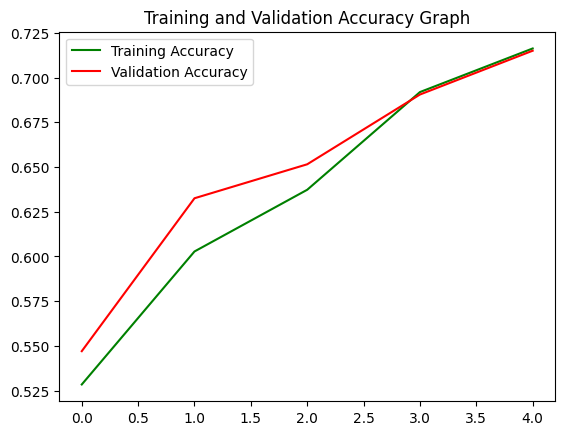

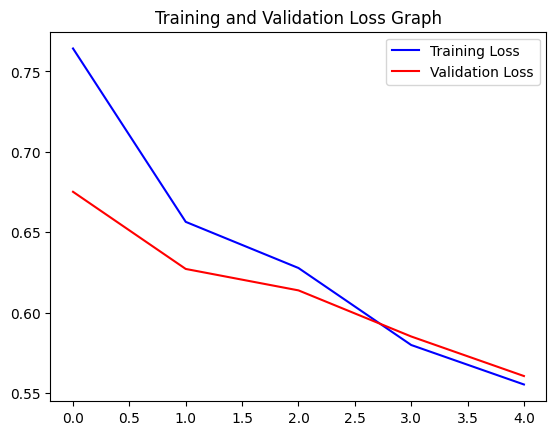

In [328]:
# Get training and validation accuracy from history
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))


# Plot training and validation accuracy
plt.plot(epochs, acc, 'g', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Training and Validation Accuracy Graph')
plt.legend()
plt.figure()


# Get training and validation loss from history
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(loss))


# Plot training and validation loss
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss Graph')
plt.legend()
plt.show()


# Taking Input Iamge or Uploading Iamge

In [335]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt

# Load and resize to match model input
img_path = 'S1.jpg' # change to your atual image path
img = load_img(img_path, target_size=(128 , 128))  # model expects 32x32
img_array = img_to_array(img) / 255.0  # normalize
img_array = np.expand_dims(img_array, axis=0)  # (1, 32, 32, 3)


# Show Size And Resolution Of Uploaded Image

In [336]:
import os

# Replace with the path to your uploaded image
image_path = 'ii.jpg'

# Get size in bytes
size_bytes = os.path.getsize(image_path)

# Convert to KB and MB
size_kb = size_bytes / 1024
size_mb = size_kb / 1024
print(f"Size: {size_kb:.2f} KB")


from PIL import Image

# Load the image
img = Image.open('ii.jpg')  # Replace with your image path

# Get resolution
width, height = img.size
print(f"Resolution: {width} x {height} pixels")

Size: 1548.78 KB
Resolution: 1220 x 1511 pixels


# Resize The Uploaded Image

In [322]:
from PIL import Image
import numpy as np

# Load and preprocess the image
img = Image.open('ii.jpg')  # Change to your image path
img = img.resize((128, 128))                 # Resize to match model input
img_array = np.array(img) / 255.0            # Normalize (0 to 1)
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension

# Ready to pass to model.predict()
prediction = model.predict(img_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


# Predict The Results

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


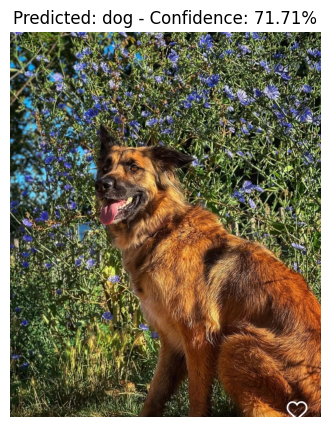

Raw prediction probabilities: [0.7171294]


In [338]:
# Make prediction
prediction = model.predict(img_array)

# Class labels
class_names = ['dog', 'cat']


# Binary classification: use threshold
predicted_label = 'dog' if prediction[0][0] > 0.5 else 'cat'

plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.title(f'Predicted: {predicted_label} - Confidence: {prediction[0][0]*100:.2f}%')
plt.axis('off')
plt.show()


# Debug output
print("Raw prediction probabilities:", prediction[0])


# Save Model

In [152]:
model.save('image_classification_model.keras')